In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
from torch import nn
import matplotlib.pyplot as plt
import math
import os

import sysmk
sys.path.append('../')
import plotting_functions as pf
import model_utils as mu
import data_utils as du

In [2]:
plot_specs = {'save': True,
              'show': False,
              'save_dir': './figures/'}

In [3]:
dim_input = 4  # Input dimension = `label_tensor.size(1)`
dim_context = 6
dim_features_per_context = int(2**(math.log(dim_input,2)+1) - 1)
batch_size = dim_input * dim_context

In [4]:
# network
n_hidden_layers = 2
gate_output = False

# data
symmetric_contexts = True
separate_contexts = False

# novel stimuli
# held_out = [(i * dim_input) - 1 for i in range(2, dim_context+1)]
held_out = []

In [5]:
from GLNNet import GLNNet, train

dim_hidden = 100  # Hidden neurons
dim_output = dim_features_per_context * dim_context if separate_contexts else dim_features_per_context

if n_hidden_layers == 2:
    dims = (dim_input, dim_hidden, dim_hidden*dim_context, dim_output)
    gateable_layers = [2]
    pathways = (1,1,dim_context,1)
    
elif n_hidden_layers == 1:
    if not gate_output:
        dims = (dim_input, dim_hidden*dim_context, dim_output)
        gateable_layers = [1]
        pathways = (1,dim_context,1)
    else:
        dims = (dim_input, dim_hidden, dim_output)
        gateable_layers = [2]
        pathways = (1,1,dim_context)

gdlnn_model = GLNNet(dims=dims, pathways=pathways)

In [6]:
base_name = ''.join([str(p) for p in pathways]) + '/'
base_name += 'sym_' if symmetric_contexts else 'asym_'
base_name += 'sep' if separate_contexts else 'tog'
if len(held_out) > 0:
    base_name += '/'
    base_name += '_'.join([str(h) for h in held_out])
    
path = './figures/' + base_name + '/'
 
if not os.path.exists(path) and plot_specs['save']:
    os.makedirs(path)
    
plot_specs['save_dir'] = path

print(path)

./figures/1161/sym_tog/


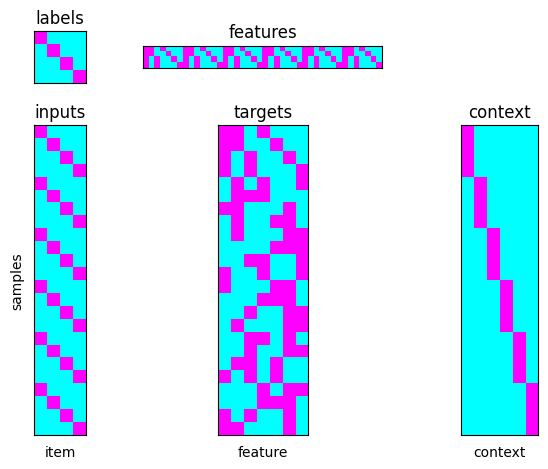

In [7]:
tree_labels, tree_features_all = du.hsd_context(n_items=dim_input, n_contexts=dim_context, 
                                                symmetry=symmetric_contexts)
label_tensor, feature_tensor, context_tensor = du.get_batch(tree_labels, tree_features_all, dim_context, 
                                                            separation=separate_contexts)

pf.plot_inputs_targets_contexts(label_tensor, feature_tensor, context_tensor, held_out, labels=tree_labels, 
                                features=tree_features_all, plot_specs=plot_specs)

tensor([2.6458, 1.7321, 1.0000, 1.0000])


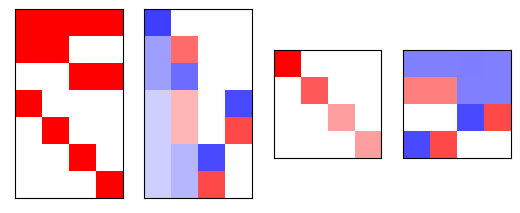

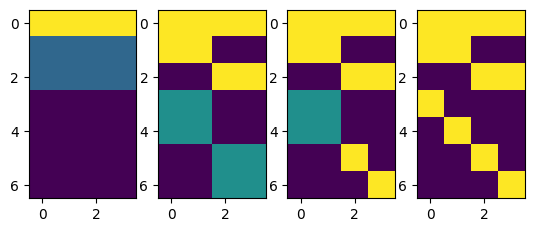

In [8]:
y_split = torch.split(feature_tensor, 4, dim=0)
x = label_tensor
# x = torch.cat((x, context_tensor), dim=1)
x_split = torch.split(x, 4, dim=0)

sigmas = [(y.T @ x) for y,x in zip(y_split, x_split)]

k = 0
U, S_, V = torch.svd(sigmas[k])
print(S_)
n_val = len(S_)

fig, axes = plt.subplots(1,4)

sigma = sigmas[k].detach().numpy()
U = U.detach().numpy()
S = torch.diag(S_).detach().numpy()
V = V.detach().numpy()

axes[0].imshow(sigma, cmap='bwr', vmin=-1, vmax=1)
axes[1].imshow(U, cmap='bwr', vmin=-1, vmax=1)
axes[2].imshow(S, cmap='bwr', vmin=-np.max(S), vmax=np.max(S))
axes[3].imshow(V.T, cmap='bwr', vmin=-1, vmax=1)

for ax in axes:
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

fig, axes = plt.subplots(1, n_val)
mat_sum = np.zeros_like(np.outer(U[:,0], V[:,0]))
for i in range(n_val):
    mat = np.outer(U[:,i], V[:,i])
    mat_sum += S_[i].numpy() * mat
    axes[i].imshow(mat_sum)

# plt.figure()
# eigvals, eigvecs = np.linalg.eig(sigma.T @ sigma)
# idx = eigvals.argsort()[::-1]   
# eigvals = eigvals[idx]
# eigvecs = eigvecs[:,idx]
# plt.imshow(eigvecs, cmap='bwr')

# plt.figure()
# a = np.array([[0,0,1,0,0,0,0],
#                      [1,0,0,0,0,0,0],
#                      [0,0,0,0,0,1,0],
#                      [0,1,0,0,0,0,0],
#                      [0,0,0,1,0,0,0],
#                      [0,0,0,0,1,0,0],
#                      [0,0,0,0,0,0,1]]) @ sigma

# b = a @ np.array([[0,0,0,1],[0,0,1,0],[1,0,0,0],[0,1,0,0]])

# plt.figure()
# plt.imshow(a)
# plt.figure()
# plt.imshow(b)

tensor([13.8764,  4.0675,  2.8447,  2.1926])


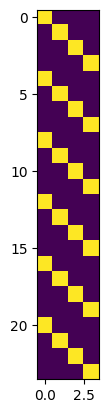

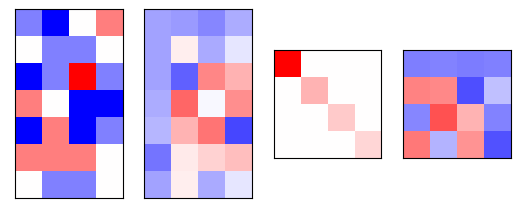

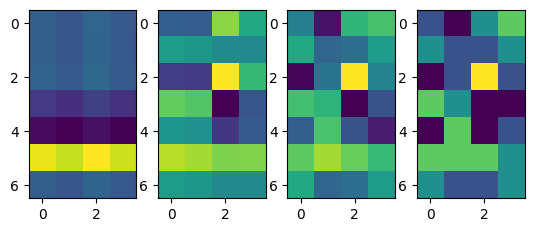

In [9]:
y = feature_tensor
x = label_tensor
# x = torch.cat((x, context_tensor), dim=1)
plt.imshow(x.detach().numpy())
sigma = y.T @ x

U, S_, V = torch.svd(sigma)
print(S_)

n_val = len(S_)

fig, axes = plt.subplots(1, 4)

sigma = sigma.detach().numpy()
U = U.detach().numpy()
S = torch.diag(S_).detach().numpy()
V = V.detach().numpy()

axes[0].imshow(sigma, cmap='bwr')
axes[1].imshow(U, cmap='bwr', vmin=-1, vmax=1)
axes[2].imshow(S, cmap='bwr', vmin=-np.max(S), vmax=np.max(S))
axes[3].imshow(V.T, cmap='bwr', vmin=-1, vmax=1)

for ax in axes:
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

fig, axes = plt.subplots(1, n_val)
mat_sum = np.zeros_like(np.outer(U[:,0], V[:,0]))
for i in range(n_val):
    mat = np.outer(U[:,i], V[:,i])
    mat_sum += S_[i].numpy() * mat
    axes[i].imshow(mat_sum)

tensor([11.4688,  2.6996,  1.9225,  1.8661])


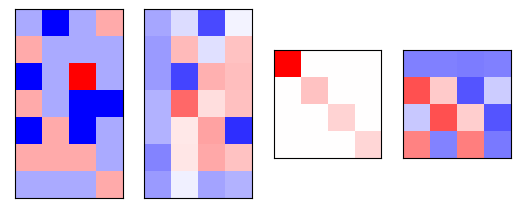

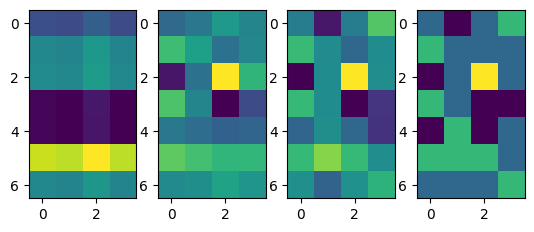

In [10]:
import itertools as it

y_split = torch.split(feature_tensor, 4, dim=0)
x = label_tensor
# x = torch.cat((x, context_tensor), dim=1)
x_split = torch.split(x, 4, dim=0)

mainlist = [i for i in range(len(y_split))]
y_split = [torch.cat([y_split[comb] for comb in combs], dim=0) for combs in it.combinations(mainlist, dim_context-1)]
x_split = [torch.cat([x_split[comb] for comb in combs], dim=0) for combs in it.combinations(mainlist, dim_context-1)]

sigmas = [(y.T @ x) for y,x in zip(y_split, x_split)]

k = 0
U, S_, V = torch.svd(sigmas[k])
print(S_)
n_val = len(S_)

fig, axes = plt.subplots(1,4)

sigma = sigmas[k].detach().numpy()
U = U.detach().numpy()
S = torch.diag(S_).detach().numpy()
V = V.detach().numpy()

axes[0].imshow(sigma, cmap='bwr')
axes[1].imshow(U, cmap='bwr', vmin=-1, vmax=1)
axes[2].imshow(S, cmap='bwr', vmin=-np.max(S), vmax=np.max(S))
axes[3].imshow(V.T, cmap='bwr', vmin=-1, vmax=1)

for ax in axes:
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

fig, axes = plt.subplots(1, n_val)
mat_sum2 = np.zeros_like(np.outer(U[:,0], V[:,0]))
for i in range(n_val):
    mat = np.outer(U[:,i], V[:,i])
    mat_sum2 += S_[i].numpy() * mat
    axes[i].imshow(mat_sum2)

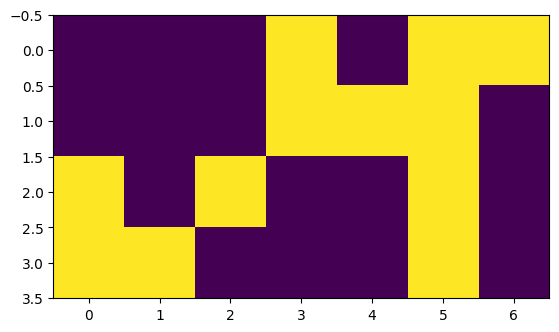

In [11]:
plt.imshow((mat_sum - mat_sum2).T)

[[5.9160800e+00 8.4985485e+00 1.0928890e+01 1.3291013e+01 1.5616408e+01
  1.7919502e+01]
 [1.7320510e+00 3.1156619e+00 3.7144036e+00 4.2315345e+00 4.6850414e+00
  5.0983620e+00]
 [1.0000000e+00 2.2443588e+00 3.0375280e+00 3.4252522e+00 3.7772551e+00
  4.1483054e+00]
 [1.0000000e+00 1.3733106e+00 2.1772134e+00 2.7625747e+00 3.0647886e+00
  3.0977480e+00]
 [7.4375443e-08 8.4555614e-01 1.3768215e+00 2.0114310e+00 2.4103959e+00
  2.6548979e+00]
 [4.2843760e-09 9.5312672e-08 5.8571160e-01 1.1660870e+00 1.7879494e+00
  2.4646404e+00]
 [0.0000000e+00 4.4205035e-09 1.0146573e-07 3.8966030e-01 1.0255115e+00
  1.7235740e+00]]


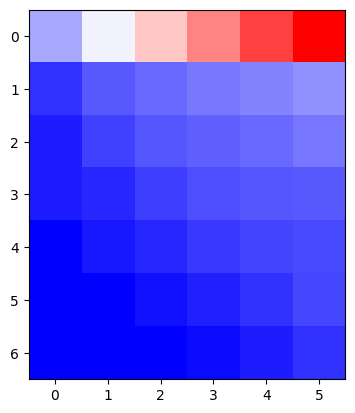

In [12]:
cat = True
n_val = dim_input if not cat else dim_context+1

y_split = torch.split(feature_tensor, 4, dim=0)
x = label_tensor
if cat:
    x = torch.cat((x, context_tensor), dim=1)
x_split = torch.split(x, 4, dim=0)

mainlist = [i for i in range(len(y_split))]

S_all = torch.zeros((n_val, dim_context))
for c in range(1, dim_context+1):
    y_comb = [torch.cat([y_split[comb] for comb in combs], dim=0) for combs in it.combinations(mainlist, c)]
    x_comb = [torch.cat([x_split[comb] for comb in combs], dim=0) for combs in it.combinations(mainlist, c)]

    sigmas = [(y.T @ x) for y,x in zip(y_comb, x_comb)]
    
    S_av = torch.zeros(n_val)
    for sig in sigmas:
        _, S, _ = torch.svd(sig)
        S_av += S
#         for i in range(n_val):
#             mat = np.outer(U[:,i], V[:,i])
#             mat_sum2 += S_[i].numpy() * mat
#             axes[i].imshow(mat_sum2)
    S_all[:, c-1] = S_av/len(sigmas)

print(S_all.numpy())
plt.imshow(S_all.detach().numpy(), cmap='bwr')

(5, 6, 24, 7)


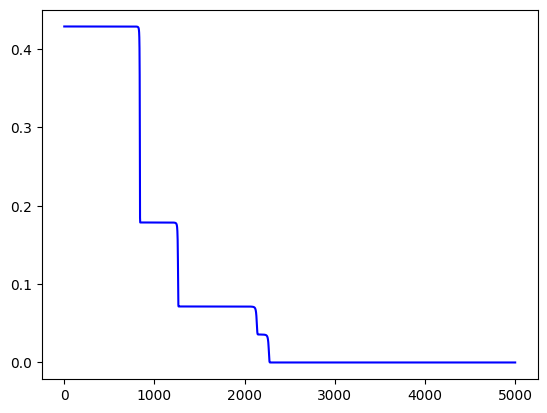

In [37]:
# Training
lr = 5.0  # Learning rate
gamma = 1e-12 * 10**10 if len(pathways) > 3 else 1e-12
n_epochs = 5000

SEED = 2021
mu.set_seed(seed=SEED)

mu.initializer_(gdlnn_model, gamma)

losses, preds, rsms = train(gdlnn_model,
                  label_tensor,
                  feature_tensor,
                  context_tensor,
                  n_epochs=n_epochs,
                  lr=lr,
                  hold_out_i=held_out,
                  corr=False)

f = plt.figure()
plt.plot(losses, 'b')
if plot_specs['save']:
    f.savefig(path + 'loss.png', format='png')
if plot_specs['show']:
    plt.show()

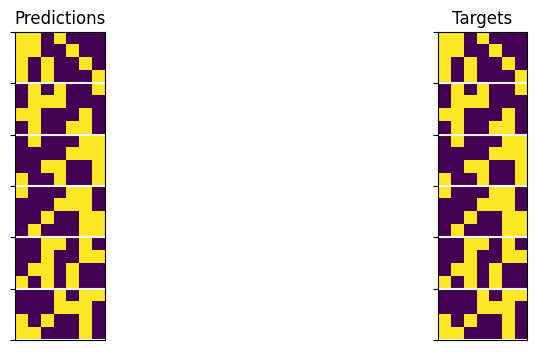

In [14]:
predictions = preds[-1,:,:]
targets = feature_tensor.detach().numpy()

pf.plot_preds_targets(predictions, targets, separate_contexts, dim_context, plot_specs)

MovieWriter mencoder unavailable; using Pillow instead.


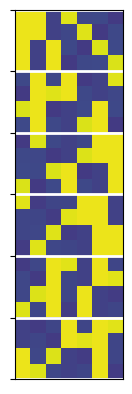

In [15]:
try:
    end_epoch = np.where(losses < 1e-7)[0][0]
except:
    end_epoch = n_epochs
pf.animate_preds(preds, end_epoch, separate_contexts, dim_context, plot_specs=plot_specs)

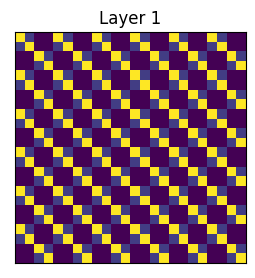

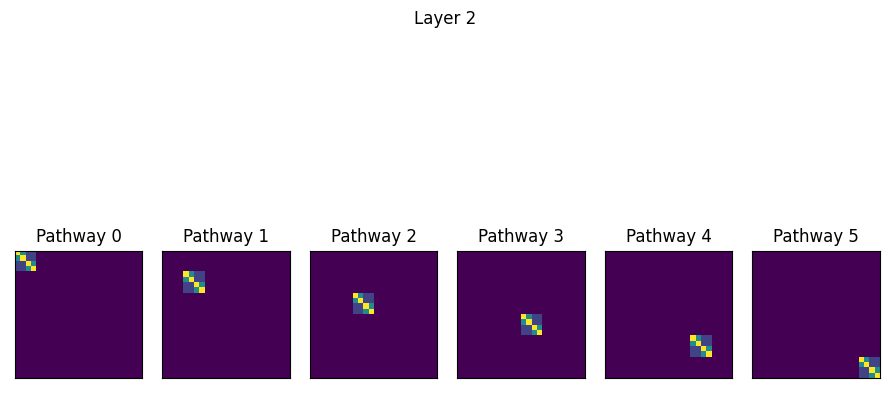

In [16]:
t = -1

for l in range(1, len(gdlnn_model.pathways)-1):
    if l in gdlnn_model.gateable_layers:
        fig, axes = plt.subplots(1,len(rsms[l]), figsize=(9,len(rsms[l])), layout='tight')
        fig.suptitle('Layer ' + str(l))
        for p, (ax, rsm) in enumerate(zip(axes, rsms[l])):
            ax.imshow(rsm[t,:,:])
            ax.xaxis.set_visible(False)
            ax.yaxis.set_visible(False)
            ax.title.set_text('Pathway ' + str(p)) 
    else:
        fig, ax = plt.subplots(1, figsize=(3,3))
        ax.imshow(rsms[l][0][t,:,:])
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        ax.title.set_text('Layer ' + str(l))
        
    if plot_specs['save']:
        fig.savefig(plot_specs['save_dir'] + 'rsm_' + str(l))
    if plot_specs['show']:
        plt.show()

## Shared multi-context pathway

In [17]:
if n_hidden_layers == 2:
    dims = (dim_input, dim_hidden, dim_hidden*(dim_context+1), dim_output)
    pathways = (1,1,dim_context+1,1)
elif n_hidden_layers == 1:
    if not gate_output:
        dims = (dim_input, dim_hidden*(dim_context+1), dim_output)
        pathways = (1,dim_context+1,1)
    else:
        raise ValueError('Cannot have shared pathway if gating is on output')

mapping = [[0,i] for i in range(1,dim_context+1)]        
print(mapping)
multi_pathway_model = GLNNet(dims=dims, pathways=pathways, context_to_pathway_map=mapping)

[[0, 1], [0, 2], [0, 3], [0, 4], [0, 5], [0, 6]]


In [18]:
base_name = ''.join([str(p) for p in pathways]) + '/'
base_name += 'sym_' if symmetric_contexts else 'asym_'
base_name += 'sep' if separate_contexts else 'tog'
if len(held_out) > 0:
    base_name += '/'
    base_name += '_'.join([str(h) for h in held_out])
    
path = './figures/' + base_name + '/'
 
if not os.path.exists(path) and plot_specs['save']:
    os.makedirs(path)
    
plot_specs['save_dir'] = path

print(path)

./figures/1171/sym_tog/


In [19]:
# Training
lr = 2.0  # Learning rate
gamma = 1e-12 * 10**10 if len(pathways) > 3 else 1e-12
n_epochs = 5000

SEED = 2021
mu.set_seed(seed=SEED)

mu.initializer_(multi_pathway_model, gamma)

losses, preds, rsms = train(multi_pathway_model,
                  label_tensor,
                  feature_tensor,
                  context_tensor,
                  n_epochs=n_epochs,
                  lr=lr,
                  hold_out_i=held_out,
                  corr=True)

f = plt.figure()
plt.plot(losses, 'b')
if plot_specs['save']:
    f.savefig(path + 'loss.png', format='png')
if plot_specs['show']:
    plt.show()

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

[tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.]]), tensor([[1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0.],
        [1., 0., 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



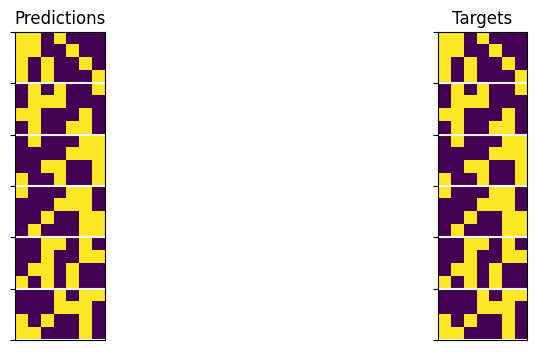

In [20]:
predictions = preds[-1,:,:]
targets = feature_tensor.detach().numpy()

pf.plot_preds_targets(predictions, targets, separate_contexts, dim_context, plot_specs)

MovieWriter mencoder unavailable; using Pillow instead.


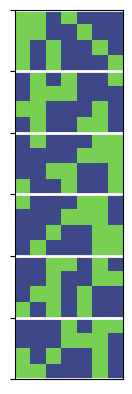

In [21]:
try:
    end_epoch = np.where(losses < 1e-7)[0][0]
except:
    end_epoch = n_epochs
pf.animate_preds(preds, end_epoch, separate_contexts, dim_context, plot_specs=plot_specs)

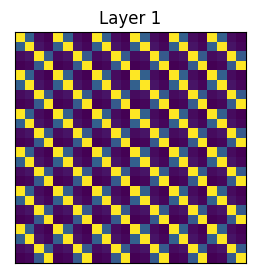

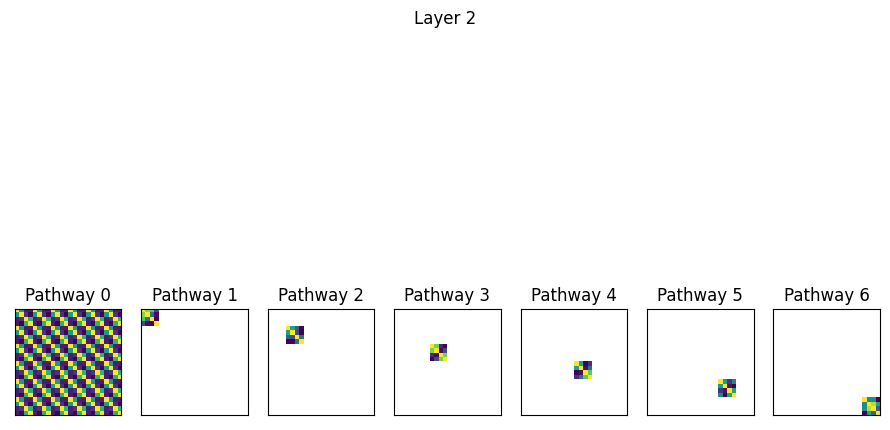

In [22]:
t = -1

for l in range(1, len(gdlnn_model.pathways)-1):
    if l in gdlnn_model.gateable_layers:
        fig, axes = plt.subplots(1,len(rsms[l]), figsize=(9,len(rsms[l])), layout='tight')
        fig.suptitle('Layer ' + str(l))
        for p, (ax, rsm) in enumerate(zip(axes, rsms[l])):
            ax.imshow(rsm[t,:,:])
            ax.xaxis.set_visible(False)
            ax.yaxis.set_visible(False)
            ax.title.set_text('Pathway ' + str(p)) 
    else:
        fig, ax = plt.subplots(1, figsize=(3,3))
        ax.imshow(rsms[l][0][t,:,:])
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        ax.title.set_text('Layer ' + str(l))
                
    if plot_specs['save']:
        fig.savefig(plot_specs['save_dir'] + 'rsm_' + str(l))
    if plot_specs['show']:
        plt.show()

(5, 24, 24)
(1, 24, 24)


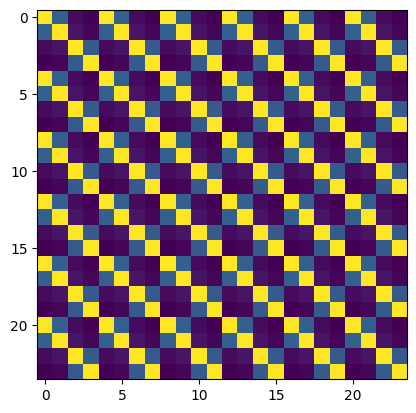

In [23]:
# plt.imshow(np.sum(rsm[1][0]))
print(rsms[1][0].shape)
rsms_all = np.array([r[-1,:,:] for r in rsms[1]])
print(rsms_all.shape)
rsms_sum = np.nansum(rsms_all, axis=0)
plt.imshow(rsms_sum)


## ReLU equivalent

In [24]:
# network
final_relu = False if not gate_output else True

In [25]:
from ReluNNet import ReluNNet

relunn_model = ReluNNet(dims=dims, n_context=dim_context, gateable_layers=gateable_layers, final_relu=final_relu)

print(relunn_model.layers)

Sequential(
  (w0): Linear(in_features=4, out_features=100, bias=False)
  (eye0): Identity()
  (w1): Linear(in_features=106, out_features=700, bias=False)
  (relu1): ReLU()
  (w2): Linear(in_features=700, out_features=7, bias=False)
)


In [26]:
base_name = 'relu_' + str(n_hidden_layers) + '/'
base_name += 'sym_' if symmetric_contexts else 'asym_'
base_name += 'sep' if separate_contexts else 'tog'
if len(held_out) > 0:
    base_name += '/'
    base_name += '_'.join([str(h) for h in held_out])
    
path = './figures/' + base_name + '/'
 
if not os.path.exists(path) and plot_specs['save']:
    os.makedirs(path)
    
plot_specs['save_dir'] = path
plot_specs['save'] = True
print(path)

./figures/relu_2/sym_tog/


1e-07


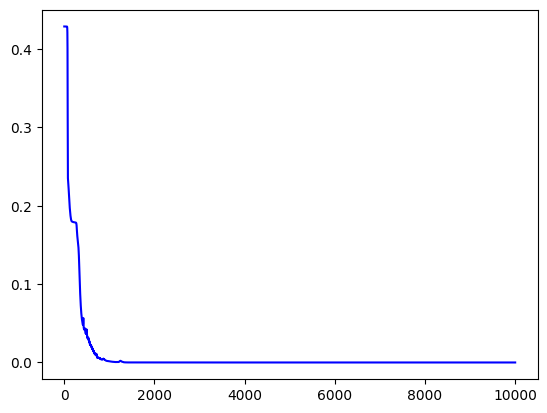

In [27]:
# Training
from GLNNet import train
lr = 2.  # Learning rate
gamma = 1e-12 * 10**5 if len(dims) > 3 else 1e-12
print(gamma)
n_epochs = 10000

SEED = 2021
mu.set_seed(seed=SEED)

mu.initializer_(relunn_model, gamma)

losses, preds, rsms = train(relunn_model,
                  label_tensor,
                  feature_tensor,
                  context_tensor,
                  n_epochs=n_epochs,
                  lr=lr,
                  hold_out_i=held_out,
                  corr=False,
                  rsm_interval=1000)

plt.plot(losses, 'b')
plt.show()

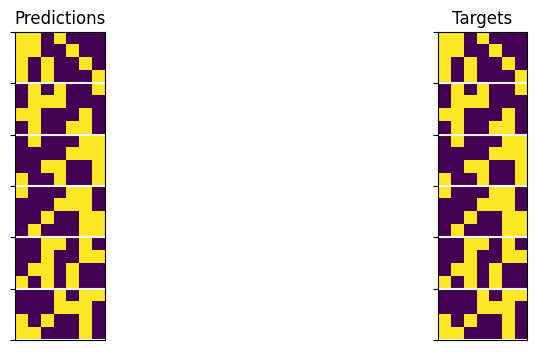

In [28]:
predictions = preds[-1,:,:]
targets = feature_tensor.detach().numpy()

pf.plot_preds_targets(predictions, targets, separate_contexts, dim_context, plot_specs)

MovieWriter mencoder unavailable; using Pillow instead.


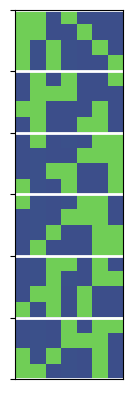

In [29]:
end_epoch = np.where(losses < 1e-7)[0][0]
pf.animate_preds(preds, end_epoch, separate_contexts, dim_context, plot_specs=plot_specs)

2


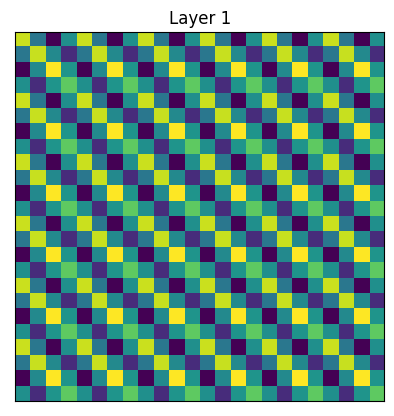

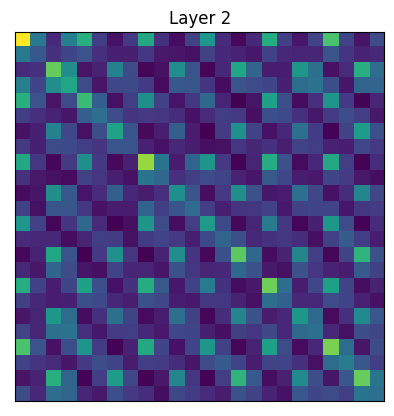

In [30]:
g = relunn_model.gateable_layers[0]
print(g)

t = -1

fig, ax = plt.subplots(1)
ax.imshow(rsms[g-1][0][t,:,:])
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.title.set_text('Layer 1')

fig, ax = plt.subplots(1)
ax.imshow(rsms[g][0][t,:,:])
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.title.set_text('Layer 2')
# plt.imshow(rsms[2][0])

In [31]:
# import matplotlib.animation
# from IPython.display import display, clear_output

# preds_ = preds
# vmin, vmax = np.min(preds_), np.max(preds_)
# n_frames = 1000
# iter_size = n_epochs // min(n_epochs, n_frames)

# fig, ax = plt.subplots()
# l = ax.imshow(preds_[0,:,:], vmin=vmin, vmax=vmax)

# animate = lambda i: l.set_data(preds_[int(i),:,:])

# for i in range(0, n_epochs, iter_size):
#     animate(i)
#     clear_output(wait=True)
#     display(fig)